<a href="https://colab.research.google.com/github/shivamparihar12/Face-Classification/blob/main/Face_Classification_using_Haar_Cascade%2C_Facenet_and_K_Means_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Solution can be divided into different parts:

1.   Detect if the image has a face or not.
2.   Extract faces and store its embeddings

3.   k-means Clustering: Find out the suitable value of k using elbow method

4.   Cluster images, and find out precision and recall.




1.   For detecting if the image has a face or not, and extracting faces from the image, I preferred using haarcascade over mtcnn model as our dataset consisted of very good images, and haar cascade in not a deep learning model, so would take smaller time to run, without reducing the quality of results.

2. The extracted images were fed to facenet model for generating embeddings.
3.  The generated embeddings were now used for clustering. The k value(no of people in the dataset) was to be found be elbow method.


4.   After that we proceeded with our clustering and got required results






In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#importing the Image class from PIL package
from PIL import Image

# #read the image, creating an object
# im = Image.open(r"D:\Open Picture Python\picture-1.jpg")

# #show picture
# im.show()

The Excel file for labellings of dataset should look like this

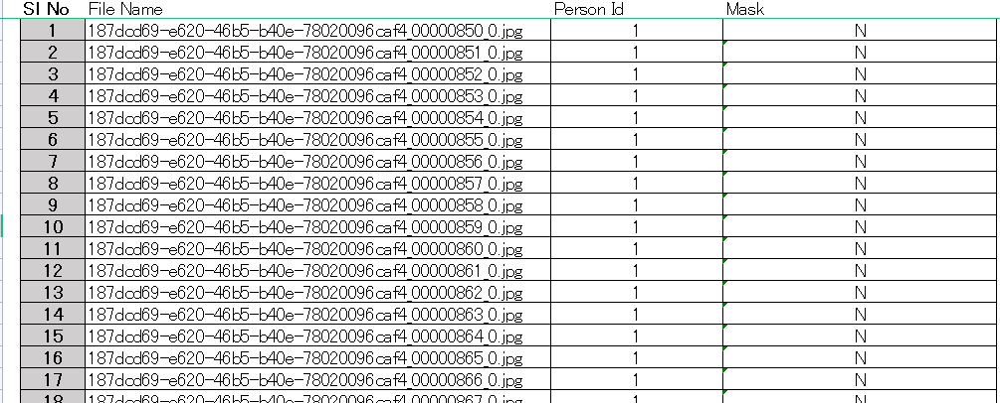

In [ ]:

import pandas as pd
dict={}
maskdict={}

path_to_annotations="/content/(English translate)20210426_image_classification_Imbesideyou (1).xlsx" ## path of excel file with annotations
df=pd.read_excel(path_to_annotations)
# ##storing all the annotations with respect to file name in a dictionary. Used different dictionary to store person
# id required to measure precision and recall of clustering done by our model.
##also stored whether an image has a person with mask or not
for i in range(len(df["File Name"])):
  dict[df["File Name"][i]]=df["Person Id"][i]
  maskdict[df["File Name"][i]]=df["Mask"][i]



print(len(dict))

57898


In [ ]:
#@title This is for unzipping if images are provided inside a zip file

# !unzip -u "/content/drive/MyDrive/face_images.zip" -d "/content/drive/MyDrive/Iambesideyou"



In [ ]:
# importing libraries
import torch
!pip install facenet-pytorch

from facenet_pytorch import MTCNN, InceptionResnetV1
import torch
from torchvision import datasets
from torch.utils.data import DataLoader
from PIL import Image

face_list = [] # list of cropped faces from photos folder
name_list = [] # list of names corrospoing to cropped photos
embedding_list = [] # list of embeding matrix after conversion from cropped faces to embedding matrix using resnet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 30.7 MB/s 


In [ ]:
##initialisation of GPU

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Running on device: {}'.format(device))



Running on device: cuda:0


In [ ]:
#@title Used HaarCascade to detect and extract crop faces from the image


from os import listdir
from os.path import isdir
from PIL import Image
from matplotlib import pyplot
from numpy import savez_compressed
from numpy import asarray
#from mtcnn import MTCNN
import cv2

def extract_face(filename, required_size=(244, 244)):

	# load image from file
  image = Image.open(filename)
	# convert to RGB, if needed
  image = image.convert('RGB')
	# convert to array
  pixels = asarray(image)
  grey=cv2.cvtColor(pixels, cv2.COLOR_RGB2GRAY)

	# create the detector, using default weights
  #detector = MTCNN()
	# detect faces in the image
  #results = detector.detect_faces(pixels)


  face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
  faces=face_cascade.detectMultiScale(grey)
  p=0
  	# extract the bounding box from the first face

  #face=pixels[y1:y1+h,x1:x1+h]
  for (x,y,w,h) in faces:
    ##not intending for more than one image from the face
    if(p==1):
      break
    x,y=abs(x),abs(y)
    face=pixels[y:y+h,x:x+w]
    p=p+1
	# bug fix

	# resize pixels to the model size
    image = Image.fromarray(face)
    image = image.resize(required_size)
    face_array = asarray(image)
    return face_array

Very Important: The directory should not contain any sub directory as per this code.

In [ ]:
allimages=[]
import os
from os import listdir
count=0
## path to images . Important: Keep all images in the same folder

dir="/content/drive/MyDrive/pytorch_face_recognition-main/all photos/face_images/face_images/a055a66f-46ea-4c57-8de4-f3cc4f27c59c"
# for filename in os.listdir(dir):
#   folder_dir= os.path.join(dir,filename)
for images in os.listdir(dir):
    count+=1
    # check if the image ends with png



    if (images.endswith(".jpg")):
        faces=extract_face(dir+"/"+images)
        if faces is not None:
          if(dict.get(images)!=None and maskdict[images]!="Y"):
            # print(count)
            allimages.append([faces,images])


KeyboardInterrupt: ignored

In [ ]:
# import os
# from os import listdir
# dir="/content/drive/MyDrive/pytorch_face_recognition-main/all photos/face_images"
# for filename in os.list(dir):
#   print(filename)


# # get the path/directory
# dir="/content/drive/MyDrive/pytorch_face_recognition-main/all photos/face_images"
# folder_dir = "/content/drive/MyDrive/all photos/face_images/face_images/a055a66f-46ea-4c57-8de4-f3cc4f27c59c"
# allimages=[]
# count=0


# for images in os.listdir(folder_dir):
#     count+=1
#     # check if the image ends with png



#     if (images.endswith(".jpg")):
#         faces=extract_face(folder_dir+"/"+images)
#         if faces is not None:
#           if(dict.get(images)!=None and maskdict[images]!="Y"):

#             allimages.append([faces,images])



print(len(allimages))

print(count)

13412
19174


In [ ]:
# torch.save(allimages,"data2.pt")
# allimages=[]

print(len(allimages))
# print(allimages)

13412


In [ ]:
#@title Custom Dataset for storing our images in batches

import os
import pandas as pd
import torchvision
from torchvision.io import read_image
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

class CustomImageDataset(Dataset):
    def __init__(self, allimages , img_dir, transform=None, target_transform=None):
        self.img_labels = allimages
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        # img_path = os.path.join(self.img_dir, self.img_labels[idx])
        # # facearr=extract_face(img_path)

        # image = Image.open(img_path)

        image=allimages[idx][0]
        # image=torchvision.transforms.Resize(size=(224,224),interpolation=torchvision.transforms.InterpolationMode.BICUBIC)(image)
        image = TF.to_tensor(image)
        # image.unsqueeze_(0)

        label=allimages[idx][1]

        # print(image)
        # print(idx)

        # label = self.img_labels.iloc[idx, 1]
        if self.transform:
            image = self.transform(image)
        # if self.target_transform:
        #     label = self.target_transform(label)
        return image,label

In [ ]:
dir='/content/drive/MyDrive/pytorch_face_recognition-main/all photos/face_images/face_images/a055a66f-46ea-4c57-8de4-f3cc4f27c59c'
# allimages=[]
# for i in range(20):
#     try:
#         df = pd.read_pickle('data')
#     except EOFError:
#         time.sleep(0.5)
# allimages = torch.load("/content/data.pt")
# tensor_list2 = torch.load('/content/data2.pt')
# for it in tensor_list2:
#   allimages.append(it)

batch_size=32
dataset= CustomImageDataset(allimages=allimages, img_dir=dir)
dataloader= DataLoader(dataset=dataset, batch_size=batch_size)
# for x,y in dataloader:
#   print(y)

# # idx_to_class = {i:c for c,i in dataset.class_to_idx.items()} # accessing names of peoples from folder names

# print(dataloader)


In [ ]:
#@title Generating Embeddings

import numpy as np

# mtcnn = MTCNN(image_size=240, margin=0, min_face_size=20,device=device) # initializing mtcnn for face detection
resnet = InceptionResnetV1(pretrained='vggface2').eval().to(device) # initializing resnet for face img to embeding conversion

# dataset=datasets.ImageFolder('/content/drive/MyDrive/pytorch_face_recognition-main/all photos/face_images/face_images/a055a66f-46ea-4c57-8de4-f3cc4f27c59c') # photos folder path
# idx_to_class = {i:c for c,i in dataset.class_to_idx.items()} # accessing names of peoples from folder names

# def collate_fn(x):
#     return x[0]

# loader = DataLoader(dataset, batch_size=100, collate_fn=collate_fn)
# dataloader=dataloader.to(device)


face_list = [] # list of cropped faces from photos folder
name_list = [] # list of names corrospoing to cropped photos
embedding_list = {} # list of embeding matrix after conversion from cropped faces to embedding matrix using resnet
embedding_list1={}
for img,idx in dataloader:
  # print(img)
  # idx=np.array(idx)

  img.cuda()
  # idx.cuda()
  if img is None:
    continue
    # print(img[0])

  # print(idx)
  # print(allimages[idx])



    # print(img)

  # print(img[0])

  # face, prob = mtcnn(img[0], return_prob=True)
  # print("y")
  # if face is not None and prob>0.90: # if face detected and porbability > 90%
  emb = resnet(img.cuda()) # passing cropped face into resnet model to get embedding matrix
  # print(emb)
  ind=0
  # print(idx[5])
  # print(len(emb.detach()))
  # print(type(idx[0]))
  # print(type(emb[0]))
  emb=emb.detach()
  emb1=emb.cpu()
  # idx1=idx.cpu()

  for i in range(batch_size):

    # if((i-1)>=len(idx) and (i-1)>=len(emb)):
    #   continue

    try:
      key=idx[i]

    except:
      print(i)
      continue
    # print(idx[i])
    key=idx[i]
    data=emb1[i]

    embedding_list1[key]=data
    # ind+=1

  embedding_list[idx]=(emb) # resulten embedding matrix is stored in a list
  name_list.append(idx[0]) # names are stored in a list


4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31


### Saving data into data.pt file

In [ ]:
print(len(embedding_list))
# data = [embedding_list, name_list]
# torch.save(data, 'data.pt') # saving data.pt file


420


In [ ]:
a=[]
for it in embedding_list:
  emb=embedding_list[it].cpu()
  for embe in emb:
    a.append((embe).numpy())
print(len(a))

# print((name_list[0]))

13412


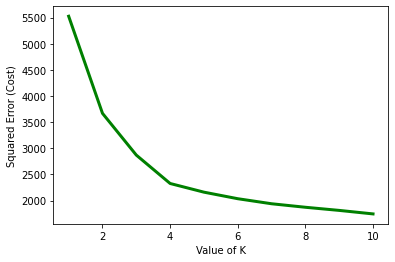

In [ ]:

# def face_match(img_path, embedding_list, name_list): # img_path= location of photo, data_path= location of data.pt
    # getting embedding matrix of the given img
    # img = Image.open(img_path)
    # face, prob = mtcnn(img, return_prob=True) # returns cropped face and probability
    # if(face!=None):

    #   emb = resnet(face.unsqueeze(0)).detach() # detech is to make required gradient false

    #   # saved_data = torch.load('data.pt') # loading data.pt file
    #   # embedding_list = saved_data[0] # getting embedding data
    #   # name_list = saved_data[1] # getting list of names
    #   # print(name_list)
    #   dist_list = [] # list of matched distances, minimum distance is used to identify the person
    #   print(embedding_list)

    #   for i in range (len(embedding_list)):
    #       print(embedding_list)

    #       dist = torch.dist(emb, embedding_list[i]).item()
    #       dist_list.append(dist)

    #   idx_min = dist_list.index(min(dist_list))
    #   return (name_list[idx_min], min(dist_list))

    # else:
    #   return ("NAN", 1000000)


# name_list=[]
# embedding_list=[]
# # count=0
# directory='/content/final list'
# image_list=[]

# # print(name_list)
# name_list.clear()
# embedding_list.clear()

# count=0



# for images in allimages:
#   count+=1

#   if(count<=15000):
#     continue





#   # count+=1
#   # if(len(name_list)==0):
#   #   image_list.append(images)

#     # print(images)
#     # print(embedding_list)
#   generate_embeddings(folder_dir+'/'+images,name_list, face_list, embedding_list,image_list)


import matplotlib.pyplot as plt
from matplotlib import style
from sklearn.cluster import KMeans
# import sklearn
# from sklearn.datasets.samples_generator import make_blobs
cost =[]
for i in range(1, 11):
    KM = KMeans(n_clusters = i, max_iter = 500)
    KM.fit(a)

    # calculates squared error
    # for the clustered points
    cost.append(KM.inertia_)

# plot the cost against K values
plt.plot(range(1, 11), cost, color ='g', linewidth ='3')
plt.xlabel("Value of K")
plt.ylabel("Squared Error (Cost)")
plt.show() # clear the plot




In [ ]:
# the point of the elbow is the
# most optimal value for choosing k
# choose k and put value in number of clusters
noofclusters=4



# print(a[0])

from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=noofclusters, random_state=0).fit(a)
import numpy as np
centers=np.array(kmeans.cluster_centers_)
labels=kmeans.labels_
ind=0

#####################   A BIT OF UN-NECESSARY CODES###################

finaldict={0:[],1:[],2:[],3:[]}


##storing labels of each image in a dictionary
for image in name_list:
  # print(image)
  # print(labels[ind])
  finaldict[labels[ind]].append(image)

  ind+=1



# print(finaldict)
finalist=[]

for i in range(4):
  for itr in finaldict[i]:


    finalist.append([itr,i])


finalist.sort()

print(len(finalist))
import pandas as pd;
df=pd.DataFrame


i=0
cluster=[]
id=[]
for itr in finalist:
  # if(i>=20):
  #   print(itr)
  cluster.append(itr[1])
  id.append(itr[0])

  # print(i)

  i+=1

# print(i)


    # print(embedding_list[0])
    # print(name_list)

420


In [ ]:
print(len(embedding_list1))

13412


On Running the below code, it will create a csv file of the form:
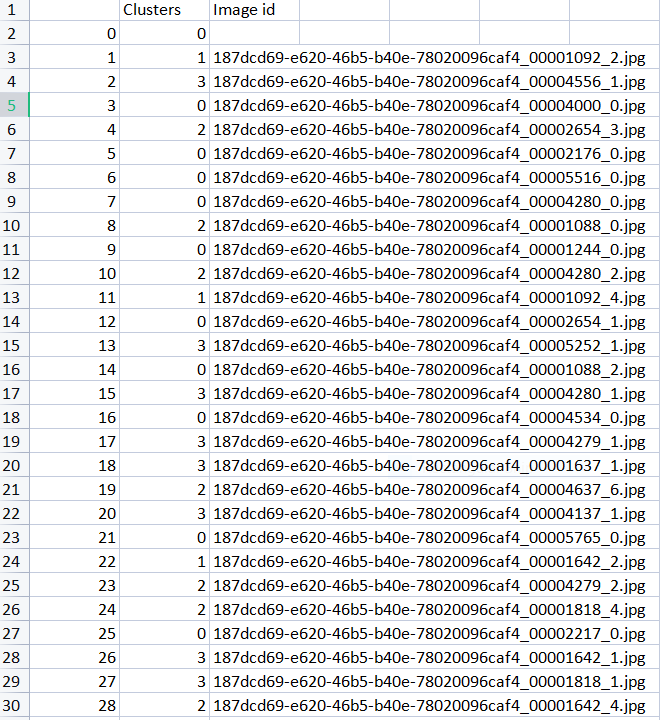

where clusters means the cluster to which that image belong to, ie: Person ID

In [ ]:
#@title Code for creating output CSV

import pandas as pd
count=0
df = pd.DataFrame([0]*len(embedding_list1), columns=['Clusters'])


df["Image id"]=""
# print(df)


for it in embedding_list1:
  print(it)
  count+=1

  path=it
  emb1 = embedding_list1[path]
  emb1= emb1.cpu()
  emb1=emb1.unsqueeze(0)
  df["Image id"][count]=it
  # using embeddings to check where the points lies in the clustering that we did
  df['Clusters'][count]=(kmeans.predict(emb1))

df.to_csv("Final_output.csv")
# print(count)
# path="187dcd69-e620-46b5-b40e-78020096caf4_00005962_1.jpg"
# face1=extract_face(path)
# face1= TF.to_tensor(face1)
# resnet1 = InceptionResnetV1(pretrained='vggface2').eval().to('cpu')
# emb1 = embedding_list1[path]
# emb1= emb1.cpu()
# emb1=emb1.unsqueeze(0)

# print(kmeans.predict(emb1))


187dcd69-e620-46b5-b40e-78020096caf4_00001092_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004556_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004000_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002654_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002176_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005516_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004280_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001088_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001244_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004280_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001092_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002654_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005252_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001088_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004280_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004534_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004279_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001637_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004637_6.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005523_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005867_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002038_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005523_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001476_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001476_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005143_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001353_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001921_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001353_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005766_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002738_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002441_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002013_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002492_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005305_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001653_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001588_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002488_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00001798_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003034_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001798_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003960_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002831_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002928_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005548_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001227_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003470_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005548_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002831_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004453_7.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004613_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004962_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003937_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003937_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001911_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001911_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003664_0.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004233_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003502_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004483_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001262_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003502_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001262_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004236_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001262_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003502_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005600_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002452_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005796_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002452_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003252_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003033_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003033_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005397_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004483_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004236_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005562_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001525_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001525_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005562_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000881_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001537_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003674_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001238_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001537_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001163_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002014_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002183_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005324_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002407_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002343_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004128_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001925_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002955_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001925_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003810_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004707_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004128_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004485_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001472_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001764_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001663_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001014_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002092_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004289_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003704_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001144_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002219_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001764_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005618_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001764_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004289_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001663_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003704_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002924_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002924_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001272_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001272_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005235_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004627_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001457_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003586_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005902_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005424_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005902_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002943_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002339_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001272_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005424_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004843_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005902_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002943_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001940_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00002250_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003963_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003829_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004222_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002411_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004222_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003211_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003165_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002932_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002942_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002932_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004854_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004854_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003165_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003489_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003270_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001528_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002932_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004074_0.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005528_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001288_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004970_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003475_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003475_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002509_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004172_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003143_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002600_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005433_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005131_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003629_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000898_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002153_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002854_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003486_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004498_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002533_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004498_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005697_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003419_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003016_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002498_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003310_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002498_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005874_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003419_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002390_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002498_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002254_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002254_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003414_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002390_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005599_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003419_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003414_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005503_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003208_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002871_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003666_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004177_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005411_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002023_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004188_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003666_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002871_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001410_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003921_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004626_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004626_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005507_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004626_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002023_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002549_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002871_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005507_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002289_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00003555_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002138_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004849_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001319_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003555_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002879_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005103_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002138_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004562_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001613_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001613_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001319_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004706_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005148_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001319_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001319_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004109_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004526_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004706_2.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003315_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001075_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001415_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005795_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005949_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001853_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001096_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005949_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003639_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002931_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002931_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004034_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001415_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004107_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003639_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002931_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002931_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004727_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004034_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005825_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002841_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002252_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000855_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002085_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005825_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004880_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002665_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004191_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002252_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002085_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001998_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004365_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004903_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004191_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004903_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004880_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003365_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004215_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005374_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001523_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004040_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004454_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005101_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003450_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003261_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000947_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003516_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002130_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005894_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002130_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004454_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005894_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001673_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005374_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001923_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002514_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001521_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002510_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004780_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002874_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002510_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002510_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005070_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001214_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004932_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005097_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001214_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005265_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004272_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002028_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004932_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004272_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001214_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005335_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005335_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002028_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002548_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001845_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005563_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001987_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003393_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003749_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003749_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004252_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001629_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001629_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005086_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001845_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001987_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002673_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004788_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001629_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005396_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004788_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005086_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00000927_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002687_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001840_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002572_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001840_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005155_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001001_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002446_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003974_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003366_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002687_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001875_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003974_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005943_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004000_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001244_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001244_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002008_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001244_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003594_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001440_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003594_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003726_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005799_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005095_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004428_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001586_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005799_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002757_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003773_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001440_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003773_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003773_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005799_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003052_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004428_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001779_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001586_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002025_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003376_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003376_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003998_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002025_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005215_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003311_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004693_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004693_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004032_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001979_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001979_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003311_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003998_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002133_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001895_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003376_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001383_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005542_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002491_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002154_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005658_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001867_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002491_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004926_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001930_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003729_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004926_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004926_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004468_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001930_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005570_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005886_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005886_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005570_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004030_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001867_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003729_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005308_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004553_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004553_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001558_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002503_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002503_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002527_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003493_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004939_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003816_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004939_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003493_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003437_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003816_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002527_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003446_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004553_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001337_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001331_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003110_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005147_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005147_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004337_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004337_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001978_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002593_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001706_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003585_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004026_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003110_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001188_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003585_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003110_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005797_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001706_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003585_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003958_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003958_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002590_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002590_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003738_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004262_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003738_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002590_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004633_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003428_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005060_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003823_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003229_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004915_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001962_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002285_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003823_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004915_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004262_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004633_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004633_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005153_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001118_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001118_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004580_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003688_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005153_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002765_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002476_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004698_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003688_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002765_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005952_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003832_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003741_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005200_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003712_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005885_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003832_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002370_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005079_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004208_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001541_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002507_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001734_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004360_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001430_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004208_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001430_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005307_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002677_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001174_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005307_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004360_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001174_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005633_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001430_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005307_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005338_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004662_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001327_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005750_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002505_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004575_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005168_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001210_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004575_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002691_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002691_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005068_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001327_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001210_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004376_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005936_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004369_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001926_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003022_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005936_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001466_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001341_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004224_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001156_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003441_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001914_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004608_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003441_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004462_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001242_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001341_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001341_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001341_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003361_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004608_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003361_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001914_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004473_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001156_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004345_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000884_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005225_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005074_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002486_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001936_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001497_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002486_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005074_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004527_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004345_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003848_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004527_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003119_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001497_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005177_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002192_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001936_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001936_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001370_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001364_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001370_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001370_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003363_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005547_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002690_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003363_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003790_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003363_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001364_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001164_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002885_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004307_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001364_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002885_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002144_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001164_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005191_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002801_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002864_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003957_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002801_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002864_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004152_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001355_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004146_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002484_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001187_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004146_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003957_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004146_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003479_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005575_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001355_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003939_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005259_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001355_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005239_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003353_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002201_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002530_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004410_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004542_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002201_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001644_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003037_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003693_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005474_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001644_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004410_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004410_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003037_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003693_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001804_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005245_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001644_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001301_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002902_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001113_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004509_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003115_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001301_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003956_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003886_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002768_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005102_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002246_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002786_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005473_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005325_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003805_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004447_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002246_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003805_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002768_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004217_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004346_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001191_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004632_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004073_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005972_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003644_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004632_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002961_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005787_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005316_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001680_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004632_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005015_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005787_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001507_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001680_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002961_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002545_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004347_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005777_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002862_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003278_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005934_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002625_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002862_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001453_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003278_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001016_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003278_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002862_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005934_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004347_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002293_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005928_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002923_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000996_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004347_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005857_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003420_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003067_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002129_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003420_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003571_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005953_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001741_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004708_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002077_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005080_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002442_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005798_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000915_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005069_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002442_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005069_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005069_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001822_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005568_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002796_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005461_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005568_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003113_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005461_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003306_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003113_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005453_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002937_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000913_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002796_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004540_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001786_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005453_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003443_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003306_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005776_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003443_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003151_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001084_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003761_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003425_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003761_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001413_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003062_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005912_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002276_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003761_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004564_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004048_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005912_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002996_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002996_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002996_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005912_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004564_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004048_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001611_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003682_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003892_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001574_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001890_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001574_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004584_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003682_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004031_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002193_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004584_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003892_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003579_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002193_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005014_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001439_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003077_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005014_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001968_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005468_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004602_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002003_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005786_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004270_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003582_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004517_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005371_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003540_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004270_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005274_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004517_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001069_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003582_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004602_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002003_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004602_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004283_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002401_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003312_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003820_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004398_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003820_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003820_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000867_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001877_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005167_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003947_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004398_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001748_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004276_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001296_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001748_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001081_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003947_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001296_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003820_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003030_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003480_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004096_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001815_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005320_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001630_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005360_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005195_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003480_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002115_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001815_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005360_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003844_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001815_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003839_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003480_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003872_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003844_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003839_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001630_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003977_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001424_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004937_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004937_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002269_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001772_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003158_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003259_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001693_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003158_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001082_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001424_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001693_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001693_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005654_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003977_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003259_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001772_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001772_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001308_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001585_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001782_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002682_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001782_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003800_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003424_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003424_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001782_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002331_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003800_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004579_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001308_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003424_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002818_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001782_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002682_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001585_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004579_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004685_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005358_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003955_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005358_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002047_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005855_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004996_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002019_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005855_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003206_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005855_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003206_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001910_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002019_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005855_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005855_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001910_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002558_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002047_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001781_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005603_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004872_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001781_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005270_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001719_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001811_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001719_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001554_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003967_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003078_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003078_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005603_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001955_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001719_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001811_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004135_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005603_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001554_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003387_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002534_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004997_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003434_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001749_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005909_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004984_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005909_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004650_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005432_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002992_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001749_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005287_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003184_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005901_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003092_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004576_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004650_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001760_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003276_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005084_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003276_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005142_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001386_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001386_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003276_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004660_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002539_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005142_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005084_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004660_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005043_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002539_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001386_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005043_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005142_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003549_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003133_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002213_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001401_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003765_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002048_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004863_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003606_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002048_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002235_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002403_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002618_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002235_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003732_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004929_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002048_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003606_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003009_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002618_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004886_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004114_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003417_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003127_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002266_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001897_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004055_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002263_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002073_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004904_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004904_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004055_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003127_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004807_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003417_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005917_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003417_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002266_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004904_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002073_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001897_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002022_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001920_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004679_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004039_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001180_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003535_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003335_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005968_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005498_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003566_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002081_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003087_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005553_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004476_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001180_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004039_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005498_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005162_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003025_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002500_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001150_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004495_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004618_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002090_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001150_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005806_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002668_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004421_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004389_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005401_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002764_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005401_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004306_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001184_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004661_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005115_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003593_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004306_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004689_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000984_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003954_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003351_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004689_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004250_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003381_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003954_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003351_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003381_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002747_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004659_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004659_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004508_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004508_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003228_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002747_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003381_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004508_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003513_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002405_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002782_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002405_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005773_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005773_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002106_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005643_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002161_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003294_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002161_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005643_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005234_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002106_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004972_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003611_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005735_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004972_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002106_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002947_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002947_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001138_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001138_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002482_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005283_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001980_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002482_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001138_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002947_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004439_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002469_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004439_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005760_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002469_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004643_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002766_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005690_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005269_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002204_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005512_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004492_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001455_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004349_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005530_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002890_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002255_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005229_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004284_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003317_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004646_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005530_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002255_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002255_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001789_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004646_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004284_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004349_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00002163_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005176_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004374_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003139_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002604_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004271_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005720_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003085_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005937_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001173_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003085_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004271_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001605_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003812_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003812_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005965_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005937_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005318_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001605_3.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004855_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004927_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004927_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005036_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001228_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002244_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001228_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001280_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001280_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005671_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002409_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001733_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004377_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004076_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001733_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004003_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002733_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004377_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005271_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00003524_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003795_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002783_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005091_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005210_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000936_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001381_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001259_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001259_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003795_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005386_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002100_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003716_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003300_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003716_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004528_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005425_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005009_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005009_0.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004828_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002101_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002126_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005434_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004845_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002126_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001093_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001093_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001464_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003006_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002101_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001464_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001464_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005434_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002376_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003040_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001484_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004976_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001318_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003390_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003364_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004058_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004226_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001718_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004640_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004058_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004058_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003111_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004226_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004865_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003380_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003390_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003380_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005047_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003473_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003390_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002005_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002448_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005090_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002759_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001346_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004008_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003109_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002740_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002440_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004008_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001575_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003912_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003462_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001575_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001346_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003861_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002759_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003912_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002456_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005090_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001346_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003481_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001333_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001235_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005908_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003988_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003431_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003431_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003988_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002875_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003557_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005908_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001583_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003481_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001583_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001849_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002769_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001849_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002769_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005621_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003251_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002148_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005746_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002325_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001463_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001856_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002674_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005746_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003356_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001495_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003251_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001856_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002917_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001856_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002917_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005746_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001463_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003482_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003356_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002168_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003084_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001403_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003084_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001458_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002806_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002474_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001178_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004436_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004497_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001178_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005165_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002806_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002851_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001178_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002851_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001506_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002198_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002168_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003922_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001664_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001604_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004361_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001784_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003595_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002838_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004361_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002398_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004057_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004057_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002838_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005929_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002297_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001752_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004057_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003968_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003968_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002838_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001371_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002196_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004991_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001905_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001371_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004563_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004563_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001371_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005762_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002099_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004563_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003114_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005351_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005463_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001384_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001306_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001384_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003523_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001306_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004776_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002156_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003559_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004701_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004701_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004776_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001003_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001912_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004701_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002046_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002046_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003559_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005564_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005206_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003684_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001912_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001981_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003559_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004479_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003175_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003175_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001547_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003038_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003038_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005504_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003647_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001661_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003769_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003876_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005504_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003551_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003876_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001661_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003175_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001661_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001547_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005888_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003769_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004323_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004774_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004111_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004774_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004111_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005426_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004423_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005359_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001349_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001325_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005359_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001349_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001473_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001850_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002060_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001473_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002232_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004323_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005359_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003241_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002973_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002973_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003241_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004378_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000865_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002973_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002314_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005125_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004834_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005109_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005125_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004578_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004834_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004378_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004197_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005163_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005125_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004378_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004266_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002212_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001787_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002974_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005828_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005696_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005496_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003970_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004651_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002707_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001878_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005496_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001152_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001447_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001878_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005696_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003970_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005404_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001257_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005275_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004140_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002316_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004393_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003350_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004140_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001997_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002223_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004393_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005608_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004424_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001997_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001997_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002223_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000974_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003350_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005608_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002300_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002316_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00002694_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003836_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004315_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002694_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001821_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001420_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004315_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002426_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001572_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001420_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003699_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003836_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000944_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001420_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001821_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005439_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001821_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000944_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001420_2.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001977_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001847_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001960_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002591_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003771_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004158_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002962_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001397_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005740_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002962_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002591_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003964_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003964_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005346_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004112_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001847_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001397_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004743_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003771_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004620_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001365_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001365_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001533_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001533_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005945_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004246_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002450_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004977_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004992_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003370_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004005_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004005_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005412_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002772_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003775_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004992_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003370_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004977_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002880_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001814_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002089_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001498_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001814_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005480_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005480_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005561_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005561_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002089_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002089_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001874_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001972_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001208_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003604_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001208_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003154_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002499_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003330_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001399_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002006_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002006_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002079_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001066_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005361_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003834_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001399_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004253_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005361_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003863_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001221_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002382_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003863_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002006_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004253_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003834_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002079_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002905_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001240_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001122_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002465_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003281_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003965_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003281_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001114_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001516_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001738_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002714_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004302_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001114_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005681_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004309_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005254_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005254_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001133_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001683_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004413_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005062_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005120_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005096_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001756_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001678_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005062_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003650_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004644_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005120_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001194_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001873_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005120_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001678_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002661_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004644_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005096_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005062_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002237_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005593_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004180_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003035_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003035_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003821_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003819_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003819_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001491_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001491_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004591_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004478_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003035_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004917_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002731_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004653_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002731_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004653_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004596_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004322_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004440_5.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003663_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003663_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001615_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001615_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003007_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003490_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001181_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005491_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004084_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003490_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003794_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003794_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001181_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003490_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005491_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003794_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003156_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005698_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003636_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00001660_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001695_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001328_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001584_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001328_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005660_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001098_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001290_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002901_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002901_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005704_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001729_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001729_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001729_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005393_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005784_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005393_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002901_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001290_3.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003835_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001393_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003234_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005174_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005527_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005349_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001493_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002908_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004797_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005349_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001393_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003234_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005174_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001377_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005174_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001377_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005349_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001393_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001493_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001068_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002067_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005460_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002461_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001247_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003301_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005710_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005460_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003301_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001247_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004704_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004170_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003301_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002067_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005792_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004704_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001253_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002067_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004170_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004431_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005513_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001179_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002560_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002560_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001387_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001111_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002560_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004545_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005513_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001956_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001481_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001111_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004431_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001691_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001303_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005237_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003505_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002945_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004210_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004422_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004422_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003840_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001186_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002541_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003512_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002451_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001186_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003840_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001243_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001186_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001289_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001197_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003395_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001197_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003395_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002451_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001704_5.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001358_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003864_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004056_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001358_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001485_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003788_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001465_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004095_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001485_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003864_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003727_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001485_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003788_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004352_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002952_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003101_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003727_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004352_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001358_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004321_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004412_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005791_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004412_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004766_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005212_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002143_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002771_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004067_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002771_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005000_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005000_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004067_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005000_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003153_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002771_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005932_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002152_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002152_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001652_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001652_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005364_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005391_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001309_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003333_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005629_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005629_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005078_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005629_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001652_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003103_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005629_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003103_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001356_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005391_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004325_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004325_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003959_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001128_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003989_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003076_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002443_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003090_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002443_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003090_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001563_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003989_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001128_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001675_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003618_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001254_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003131_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003618_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001254_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003909_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001025_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003012_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004894_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004810_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005250_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004355_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005479_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001552_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005250_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005648_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004894_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004274_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005648_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004810_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004182_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002389_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004274_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001552_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003117_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003117_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005858_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00002190_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001103_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004078_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005967_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002676_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003495_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004078_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005967_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002666_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002190_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002666_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001834_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001103_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005911_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003894_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002666_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001702_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004712_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002666_5.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005366_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002586_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002429_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001654_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001654_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003558_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005678_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005859_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005366_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005004_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001958_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005866_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003558_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005866_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005678_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005859_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004275_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005614_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001654_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005756_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003681_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002251_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001638_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003902_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002251_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002191_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002497_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003681_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003369_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001638_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002109_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004110_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003681_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005189_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003614_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003614_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003851_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002497_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001723_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001143_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001286_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002753_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004499_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002282_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005327_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002970_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001487_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004711_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001527_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003455_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001422_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001369_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005327_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001487_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004897_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001369_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004711_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005184_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002460_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001596_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002944_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002011_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005026_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005026_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003570_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004878_7.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004878_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005138_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002501_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002954_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002944_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002501_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004878_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005145_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001596_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005145_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003191_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001609_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001640_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004681_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002323_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005876_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001758_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005876_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001640_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002540_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001609_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001758_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002540_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003191_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002540_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001640_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004681_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005876_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002323_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004383_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001135_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003944_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005935_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004383_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003680_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001743_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002608_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001743_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005941_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003944_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001894_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001549_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002845_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001894_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003298_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001549_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001894_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002463_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003020_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004653_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001944_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004993_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002731_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003492_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002281_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004123_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004440_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001300_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004322_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001300_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001909_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001944_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004596_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004596_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004993_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004440_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001300_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005569_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005569_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001284_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001774_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003314_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004885_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001524_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001284_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003822_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001774_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004550_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004885_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001456_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002882_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003867_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005248_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001456_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002021_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004890_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003756_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004814_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005845_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005405_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003058_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003923_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004814_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002762_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003891_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002336_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002336_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003058_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002762_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003891_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002102_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002336_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003923_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005405_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003891_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001255_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003689_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004718_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005723_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004718_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001917_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001480_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005573_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001297_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005573_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001480_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001297_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001917_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001480_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001154_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001917_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005573_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002359_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002359_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005666_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004022_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005666_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004433_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004842_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004068_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004842_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001720_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004433_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004022_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005666_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001720_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004758_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004433_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003623_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003901_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004344_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004543_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002283_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004129_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000976_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003401_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001298_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001298_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005031_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004129_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001241_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004041_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004045_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004045_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003401_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005588_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003401_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001775_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004129_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002835_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005588_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002835_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00001701_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004044_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003069_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004044_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002557_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002557_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005050_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003592_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003141_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004065_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001844_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001260_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002094_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004044_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004065_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002094_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001844_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003141_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004341_1.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003409_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003409_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004664_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003098_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003098_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003403_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003826_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003403_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004956_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002868_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005038_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002916_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003409_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001338_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003413_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003826_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003413_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002916_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004664_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001097_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002850_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005897_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003617_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001835_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001835_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001097_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003657_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003021_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003187_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004866_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005597_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003657_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005597_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003187_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003021_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005392_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004866_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003617_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003677_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004269_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005763_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005278_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005647_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004285_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005278_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004285_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004830_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001970_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003073_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005558_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004830_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004844_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004269_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005278_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004218_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004944_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005493_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003531_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001083_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005780_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005336_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005922_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001828_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004964_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002205_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002205_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004964_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001698_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003758_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003531_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001083_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004312_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004312_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005609_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004312_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001698_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004905_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005693_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003556_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002839_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005664_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002839_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002899_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002839_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003556_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002899_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003715_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005664_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002050_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003556_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002933_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003260_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004905_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001717_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003715_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005933_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003266_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002112_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002264_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005543_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004809_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005646_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005925_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002103_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005456_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002264_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004614_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002112_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005543_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002480_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005646_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002264_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002480_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002103_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00001636_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005732_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003476_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001271_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004117_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005615_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001361_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001271_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005615_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003324_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005065_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001932_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001932_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003550_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001271_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001361_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003550_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003222_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001361_2.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002792_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001843_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003146_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002315_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005927_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005741_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005645_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004474_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005685_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005686_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003065_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005685_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005686_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004474_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004126_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002063_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004971_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004457_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002825_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003307_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002735_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002903_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004001_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003612_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001219_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005800_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001714_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005100_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005529_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004619_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001559_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003466_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004313_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002345_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004313_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004619_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005100_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001559_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002116_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003048_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004229_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005182_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001200_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002739_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003048_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005951_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002569_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003048_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005285_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002341_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005944_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001594_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003703_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001594_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005285_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002341_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002721_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001806_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002278_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002980_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003885_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002188_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001277_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002278_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004278_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003885_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000979_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003885_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003532_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003357_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002278_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005535_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001806_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002274_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000922_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003357_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002821_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004147_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004946_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003371_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004231_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004946_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003371_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004147_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004108_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004108_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004364_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004108_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002218_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001882_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002197_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004364_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004231_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001294_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004587_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001293_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001293_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001295_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005589_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005907_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005589_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002528_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001674_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001295_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003538_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003538_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002528_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002528_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004072_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005719_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002763_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001293_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002763_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002620_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005699_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003288_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004301_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003860_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001324_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001304_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003987_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003991_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003987_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002760_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003987_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001107_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004046_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001107_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003094_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000987_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002760_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005112_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005112_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00005880_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005377_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001391_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005294_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003685_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002754_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005377_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001391_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004777_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001792_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001713_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003685_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001792_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001057_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002754_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005353_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001593_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001391_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001713_1.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004354_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004354_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004836_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003068_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003814_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005675_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005387_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004047_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003635_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003583_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004836_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003814_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002052_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002052_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003583_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004836_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005653_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003635_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002052_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003322_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002926_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001577_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001171_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004342_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005178_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005178_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004342_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005178_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003004_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004342_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003004_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005253_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002926_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005253_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004342_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001171_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002797_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002797_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003930_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003669_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003394_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002203_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005447_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004138_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005683_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005058_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001522_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003308_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004793_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003394_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005058_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003669_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005130_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003669_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005683_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004138_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005447_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003601_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001452_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002151_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004610_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004299_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003245_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002151_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003709_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001802_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002437_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001802_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003733_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003709_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004610_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003733_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003245_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003245_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003709_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001176_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003429_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005484_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002785_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001625_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001625_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001625_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002919_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003520_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005484_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004639_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002919_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001891_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001429_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002785_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001891_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005484_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002946_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003429_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003410_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00005598_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002915_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003416_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001438_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001656_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003691_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003501_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001963_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003501_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001963_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001656_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005560_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003691_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001475_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002231_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001735_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004628_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001475_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003534_0.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004819_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002999_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004445_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002999_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002039_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004445_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005851_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004819_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003150_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003137_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005319_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001373_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002999_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001345_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003150_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004445_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003137_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002039_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003137_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002472_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003837_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004015_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001166_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005695_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005154_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002149_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005695_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003837_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002149_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004015_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003837_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005154_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002789_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005566_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003379_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004015_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003089_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001166_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004071_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005819_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005731_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002375_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001771_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003992_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004460_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005098_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004585_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003537_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005357_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005094_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003537_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003537_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004585_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002076_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002076_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004404_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004404_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002444_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001450_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004356_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003423_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003444_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001726_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003509_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001665_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003509_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001986_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003545_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003509_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001986_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003423_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003545_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003423_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003444_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002444_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001665_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003591_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005380_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003706_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004193_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003432_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005380_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001817_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005188_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003514_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003884_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003706_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002856_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004167_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003514_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003591_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005545_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003619_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005814_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004753_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003477_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001947_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003477_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001759_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001947_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001759_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002227_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001939_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004611_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001939_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004611_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003096_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002705_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004860_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005602_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005602_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001939_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005602_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001939_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005233_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003435_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001825_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004416_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002377_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004331_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002313_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002313_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004935_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005233_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004935_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002313_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002377_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003326_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003641_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005196_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005585_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002340_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003838_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005890_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002467_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001100_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005890_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005843_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005890_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005511_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002711_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001676_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001546_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004746_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002097_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002097_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001676_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005124_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004947_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001332_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002891_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001350_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00003660_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002185_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004391_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001707_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002752_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002752_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001707_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002185_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004079_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003459_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004079_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001362_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001362_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004782_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001362_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003707_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004391_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003772_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004658_1.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005931_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003083_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001816_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003725_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001903_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005823_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002354_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005823_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002294_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001903_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003725_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004036_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003845_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001402_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003083_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002298_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002298_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003725_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003737_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001557_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001316_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005049_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001398_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004363_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001316_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002991_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001085_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002991_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001398_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002249_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004426_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003786_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002755_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005261_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003973_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003000_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005751_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005607_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005900_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005302_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004125_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005622_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001710_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005302_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001710_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001425_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002272_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004125_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001486_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005302_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001343_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002910_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005900_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003296_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001425_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001343_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001425_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001795_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002652_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002652_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001795_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004083_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004083_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004359_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001159_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002887_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002887_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004831_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001833_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003711_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001833_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004792_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003806_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002364_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004088_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001904_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002556_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002556_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005022_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002688_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001783_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002070_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002813_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005782_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002813_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003792_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005022_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004043_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004043_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005022_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005782_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001823_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003811_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004721_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002051_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005329_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004021_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005839_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004021_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004021_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001233_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005329_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005457_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001218_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003336_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001448_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003336_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001233_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003917_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005329_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005930_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001448_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003917_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005930_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002964_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003598_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003268_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002964_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003017_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003268_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001392_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003445_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001949_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003598_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001513_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001949_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002964_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005850_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001392_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001299_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004975_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004975_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004131_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001139_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004372_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004372_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003262_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003777_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005157_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002627_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003560_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004062_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005656_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002627_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003389_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001790_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001265_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002386_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004452_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003053_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002262_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004052_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005721_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004895_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003053_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004452_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005808_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004130_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004264_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003045_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004264_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005759_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005790_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005808_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005790_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005759_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001889_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002939_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001938_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005083_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001938_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003855_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004684_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005515_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002909_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002804_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005199_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003649_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004516_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001582_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003049_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002256_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001753_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002565_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001937_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002804_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002565_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003122_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001937_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001582_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004144_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004941_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005314_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001859_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005314_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005164_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001396_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004663_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004663_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004004_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002547_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005164_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005301_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001859_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001859_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003931_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005824_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005301_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005301_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003449_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003526_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001866_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004232_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001538_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002869_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001866_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004232_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005297_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001488_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004702_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001488_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001538_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002110_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001053_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001385_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003373_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001697_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005956_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001865_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001406_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002111_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002776_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003768_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002978_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002577_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001406_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005365_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005365_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005207_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002577_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001681_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005207_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004882_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004882_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002349_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004134_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001681_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002425_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001489_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005389_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003384_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001489_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005389_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005310_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001705_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002425_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005310_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005310_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005310_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001489_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003384_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003384_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005198_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003334_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005389_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005400_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003717_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002029_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002758_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004567_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001010_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003739_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003349_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004631_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004789_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002758_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004471_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004018_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004567_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003506_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000952_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004567_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002029_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002758_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004789_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004634_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003018_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003018_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001342_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001342_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002286_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002082_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004175_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001342_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001571_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004634_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005370_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000904_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001571_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005587_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005587_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005394_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003962_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001976_5.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004808_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002726_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004225_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005107_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002270_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003180_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004225_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004861_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004980_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004980_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005107_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004333_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005291_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002773_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005107_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002773_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005829_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001688_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002698_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00002826_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004268_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002826_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004016_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005381_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004268_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005373_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004665_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002826_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002966_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004755_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002966_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001646_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001824_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004268_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002826_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001838_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005367_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004665_0.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002692_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005024_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001722_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005638_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005021_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005021_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002884_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004988_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001140_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002521_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001722_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002884_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001211_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001211_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002692_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001211_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001140_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002884_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003747_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004187_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003467_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001703_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001934_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004909_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004909_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001871_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001871_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003911_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003164_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001222_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004908_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004908_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004994_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003911_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004187_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003911_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003164_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003911_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002424_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003920_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005354_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005472_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004113_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003247_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002427_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005385_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005385_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005385_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001579_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002427_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005714_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005472_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005354_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004113_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000993_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005006_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003971_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002502_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003870_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002351_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004396_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003544_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003128_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004396_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003128_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003544_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001471_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004769_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004396_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005733_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003544_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001196_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001471_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001201_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005418_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003128_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b


187dcd69-e620-46b5-b40e-78020096caf4_00004488_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002184_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002184_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002699_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001264_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003615_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004199_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002887_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004936_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005280_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003708_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005827_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002652_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004936_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003708_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001795_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005827_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003412_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003412_3.jpg
187dcd69-e6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003624_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001639_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003543_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003624_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001246_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001639_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003724_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004829_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001443_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002310_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005533_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005830_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005830_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001443_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004127_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001896_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001896_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004127_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002310_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002365_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002365_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003239_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002728_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001659_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004007_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001061_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001659_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004870_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001659_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001659_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002728_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004870_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005519_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003388_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004007_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004870_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004368_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003388_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003255_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005514_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005514_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004186_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002220_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000970_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002220_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004554_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004546_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004186_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004554_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004186_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004546_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003328_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003328_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004546_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005420_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005420_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005420_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004241_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003472_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005846_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004241_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003631_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003472_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002400_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003472_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003631_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005846_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005524_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002400_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003472_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005846_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003631_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002275_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002275_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002400_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004241_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00005870_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002333_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001375_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005870_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002333_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003852_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001375_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003214_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002515_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001089_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002515_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005243_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005745_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002515_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001671_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005745_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001089_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005745_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005243_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001988_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003108_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005601_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002918_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004700_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002918_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001687_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004700_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001687_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005601_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001687_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005663_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005969_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003215_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005378_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001567_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002918_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005663_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001687_4.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001803_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001444_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005481_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002010_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001444_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000850_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004725_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002729_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005481_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001206_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001803_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000872_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005408_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001548_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001444_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002581_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005481_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005408_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004238_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001747_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004654_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001148_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002744_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001013_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001148_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002578_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004934_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001747_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002744_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004934_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002271_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004292_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002578_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004934_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001148_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004292_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004934_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002271_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002449_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002080_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002449_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004835_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004093_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003720_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005520_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001551_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005520_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003720_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004235_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004235_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003720_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004835_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004093_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003511_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002342_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002342_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001204_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004441_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001313_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003132_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003338_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003338_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004288_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003547_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003338_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003338_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004288_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004699_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004699_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002965_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003338_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004824_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003499_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003547_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004288_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003499_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00003713_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003746_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004918_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001258_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003713_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003713_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001441_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003746_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001258_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001258_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003713_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000906_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001441_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004918_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001039_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005537_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004484_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003465_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001279_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004287_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005898_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003517_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003167_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001768_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003167_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002071_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002071_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005898_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001768_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004174_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002071_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005898_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001768_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004287_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004174_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004174_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004287_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002799_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00004922_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002367_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002367_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002473_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002473_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004922_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002319_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000923_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002367_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002473_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002319_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004922_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003589_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001730_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001730_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003589_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003783_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002518_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001645_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001566_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004214_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001831_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001566_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005251_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003399_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004085_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001919_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005970_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001553_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005970_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003275_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001919_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004085_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001553_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005970_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002720_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001919_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003332_3.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001482_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005326_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005012_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001482_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004070_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004070_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005012_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005326_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005487_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004989_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002897_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005012_5.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005487_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005920_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005550_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004955_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004690_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005550_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005920_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001672_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004588_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003286_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004588_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005023_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003286_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003568_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005627_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002317_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005262_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001282_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001754_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005627_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005262_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001282_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002317_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001282_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001754_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001754_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00001699_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001908_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003223_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001699_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002579_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001699_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004923_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005662_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003653_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003226_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004923_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003653_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003653_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005662_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004923_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003226_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001059_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002001_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005042_2.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002922_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004652_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004115_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001796_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004105_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002998_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004105_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002998_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005282_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001517_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005596_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005596_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004958_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004958_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001372_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001492_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001492_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001492_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000863_0.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002362_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005482_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003080_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005793_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002304_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001589_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002544_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005295_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005295_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005295_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001203_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004876_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001203_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002544_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00000899_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004876_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005793_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00001589_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004876_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

187dcd69-e620-46b5-b40e-78020096caf4_00002872_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004873_4.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004873_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002872_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004873_7.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004873_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003138_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005688_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003138_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003138_6.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005688_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004966_1.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005688_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003074_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00003074_2.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00005604_0.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002462_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00004966_3.jpg
187dcd69-e620-46b5-b40e-78020096caf4_00002462_1.jpg
187dcd69-e62

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to b

In [ ]:
#@title Determining Precision metric of our Model

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

### Categorical data to be converted to numeric data
colors = ([0,1, 2, 3])

### integer mapping using LabelEncoder
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(colors)
print(integer_encoded)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)

### One hot encoding
onehot_encoder = OneHotEncoder(sparse=False)
onehot_encoded = onehot_encoder.fit_transform(integer_encoded)

print(onehot_encoded)

print(onehot_encoded[0])


[0 1 2 3]
[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]
[1. 0. 0. 0.]


In [ ]:

gold=[] #will store our gold standard

test=[] #will store results from our model
path_to_model_output="/content/Final_output.csv"
df=pd.read_csv(path_to_model_output)
for i in range(len(df["Image id"])):
  if(i==0):

    continue
  #getting image names
  key=df["Image id"][i]
  #if there is no face, we continue
  if(dict[key]==0):

    continue
  else:
    #getting the person id(labels of the image)
     cus=dict[key]
     #reducing id by 1, as Person_Id=0 meant no face
     cus-=1
  #appended the label generated from clustering model
  test.append(onehot_encoded[df["Clusters"][i]])

  # print(key)


  #appended label given in dataset
  gold.append(onehot_encoded[cus])


import numpy
gold=numpy.array(gold)
test=numpy.array(test)

ttest=test.transpose()






In [ ]:
#mathematical part of calculating precision and Recall.
ttest=test.transpose()
# print(ttest)

tttest=(numpy.matmul(test,ttest))
goldd=numpy.matmul(gold, gold.transpose())

print(tttest)

print(goldd)




[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 1. 0. 0.]
 [0. 0. 1. ... 0. 1. 0.]
 ...
 [0. 1. 0. ... 1. 0. 0.]
 [0. 0. 1. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]]
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 1. 0. 0.]
 [0. 0. 1. ... 0. 1. 1.]
 ...
 [0. 1. 0. ... 1. 0. 0.]
 [0. 0. 1. ... 0. 1. 1.]
 [0. 0. 1. ... 0. 1. 1.]]


In [ ]:
#@title Calculating values for true positive, true negative and false positive
tp=0
tot=0
fp=0
fn=0

# print(len(ttest[2]))
# print(len(goldd[2]))


for i in range(len(tttest)-1):
  for j in range(len(tttest[i])-1):
    ##condition for false negative , after taking multiplying the matrices with their tranpose.
    if(goldd[i][j]==1 and tttest[i][j]==0):
      fn+=1


    if(tttest[i][j]==1):
      tot+=1
      ##condition for true positive and false positive , after taking multiplying the matrices with their tranpose.
      if(goldd[i][j]==tttest[i][j]):
        tp+=1
      else:
        fp+=1


    # tot+=1

print(tp)
print("Precision:")

print((tp/(tp+fp))*100)

print("Recall: ", tp*100/(tp+fn))

print(tot)


43976873
Precision:
91.39819102262541
Recall:  90.79583542454232
48115693
